<a href="https://colab.research.google.com/github/Unseen-Elder/Customer_segmentation/blob/main/main/Customer_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction to Customer Segmentation in Python

Welcome to this project! We will be analyzing a customer transaction dataset in order to investigate and interpret customer behaviour of a certain supplier.

We will be doing exploratory data analysis on our data, before employing a variety of dimensionality reduction techniques, ranging from introfuctory to more advanced. We will visualize our new represntation, before clustering our customers based on their behaviour. Finally, we will visualize our clusters in an interactive way to analyze them and their differences more thoroughly.


## Project Outline
**Task 1**: Introduction

**Task 2**: Exploratory Data Analysis

**Task 3**: Principal Component Analysis

**Task 4**: Kernel Principal Component Analysis

**Task 5**: K-Means Clustering with Elbow Method

**Task 6**: Interactive Cluster Analysis


## Task 1: Introduction
[This is the dataset](https://archive.ics.uci.edu/ml/datasets/Wholesale+customers) we will be using. It is collated by Margarida G. M. S. Cardoso, and comprises annual spending across different types of retail products (for example, Frozen, Grocery, Delicatessen, etc.). We will use unsupervised methods to reduce the dimensionality of this data, and plot the resulting 2-D data, and investigate what our models are learning.

### These are the concepts and tool we will use in this project.

- [Principal Component Analysis (PCA)](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)
- [Kernel Principal Component Analysis (KPCA)](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.KernelPCA.html)
- [K-Means Clustering](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)
- [Elbow Method](https://www.scikit-yb.org/en/latest/api/cluster/elbow.html)

In [ ]:
import pandas as pd

In [ ]:
from google.colab import drive

# Mount my Google Drive to the Colab VM.
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Wholesale customers data.csv')

In [ ]:
df.head(10)

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185
5,2,3,9413,8259,5126,666,1795,1451
6,2,3,12126,3199,6975,480,3140,545
7,2,3,7579,4956,9426,1669,3321,2566
8,1,3,5963,3648,6192,425,1716,750
9,2,3,6006,11093,18881,1159,7425,2098


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Channel           440 non-null    int64
 1   Region            440 non-null    int64
 2   Fresh             440 non-null    int64
 3   Milk              440 non-null    int64
 4   Grocery           440 non-null    int64
 5   Frozen            440 non-null    int64
 6   Detergents_Paper  440 non-null    int64
 7   Delicassen        440 non-null    int64
dtypes: int64(8)
memory usage: 27.6 KB


In [ ]:
# changing datatype of columns
df = df.astype({'Channel' :'category','Region':'category'})

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Channel           440 non-null    category
 1   Region            440 non-null    category
 2   Fresh             440 non-null    int64   
 3   Milk              440 non-null    int64   
 4   Grocery           440 non-null    int64   
 5   Frozen            440 non-null    int64   
 6   Detergents_Paper  440 non-null    int64   
 7   Delicassen        440 non-null    int64   
dtypes: category(2), int64(6)
memory usage: 21.9 KB


In [ ]:
# changing the name of categories of Channel and Region
df['Channel'] = df['Channel'].map({1: 'HoReCa', 2: 'Retail'})
df['Region'] = df['Region'].map({1: 'Lisbon', 2: 'Porto', 3:'Other'})

In [ ]:
df.head(10)

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185
5,Retail,Other,9413,8259,5126,666,1795,1451
6,Retail,Other,12126,3199,6975,480,3140,545
7,Retail,Other,7579,4956,9426,1669,3321,2566
8,HoReCa,Other,5963,3648,6192,425,1716,750
9,Retail,Other,6006,11093,18881,1159,7425,2098


In [ ]:
df.Channel.value_counts()

HoReCa    298
Retail    142
Name: Channel, dtype: int64

In [ ]:
df.Region.value_counts()

Other     316
Lisbon     77
Porto      47
Name: Region, dtype: int64

In [ ]:
df.describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,12000.297727,5796.265909,7951.277273,3071.931818,2881.493182,1524.870455
std,12647.328865,7380.377175,9503.162829,4854.673333,4767.854448,2820.105937
min,3.000000,55.000000,3.000000,25.000000,3.000000,3.000000
25%,3127.750000,1533.000000,2153.000000,742.250000,256.750000,408.250000
50%,8504.000000,3627.000000,4755.500000,1526.000000,816.500000,965.500000
75%,16933.750000,7190.250000,10655.750000,3554.250000,3922.000000,1820.250000
max,112151.000000,73498.000000,92780.000000,60869.000000,40827.000000,47943.000000


## Task 2: Exploratory Data Analysis

In [ ]:
# importing visualisation tools

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')

import seaborn as sns

In [ ]:
features = [
    'Channel',
    'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicassen'
]

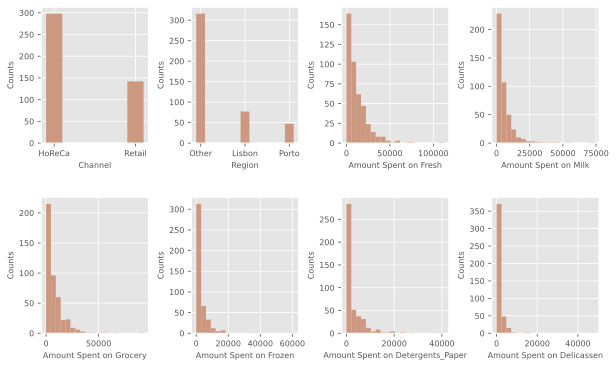

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
i=2
j=0
fig, axs = plt.subplots(2, 4)
for item in features:
  if (item=='Channel') or  (item=='Region'):
    axs[0,j].bar(df[item].value_counts().index, df[item].value_counts().values, width = 0.2,color=(0.8, 0.6, 0.5))
    axs[0,j].set_xlabel(item, fontsize=8)
    axs[0,j].set_ylabel('Counts',fontsize=8)
    axs[0,j].tick_params(axis='both', labelsize=8)
    j=j+1
  else:
    axs[(i)//4,i%4].hist(df[item],color=(0.8, 0.6, 0.5),bins=20)
    axs[(i)//4,i%4].set_xlabel('Amount Spent on '+item,fontsize=8)
    axs[(i)//4,i%4].set_ylabel('Counts',fontsize=8)
    axs[(i)//4,i%4].tick_params(axis='both', labelsize=8)
    i=i+1
plt.subplots_adjust(hspace=0.4,wspace=0.4)

In [ ]:
# pairwise plot of different features
sns.pairplot(df,plot_kws={'color':(34/255,139/255,34/255) },
             diag_kws={'color': (34/255,139/255,34/255)},height=2, aspect=2, kind='reg')

In [ ]:
sns.pairplot(df,height=2, aspect=2,hue='Channel')

In [ ]:
custom_palette = sns.color_palette(["#2ecc71", "#3498db", "#e74c3c"])
sns.set_palette(custom_palette)
sns.pairplot(df,height=2, aspect=2,hue='Region')

## Task 3: Principal Component Analysis
Let's go over some [PCA theory](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html), and see how it works!

In [ ]:
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [ ]:
features = [
    #'Channel',
    #'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicassen'
]

In [ ]:
# converting our data to numpy array
data=df[features].to_numpy()
data.shape

(440, 6)

In [ ]:
# normalising data by making mean = 0 and standard deviation = 1

scaler=StandardScaler()
std_data=scaler.fit_transform(data)
std_data[:,0].std()


1.0

In [ ]:
std_data[0,:]

array([ 0.05293319,  0.52356777, -0.04111489, -0.58936716, -0.04356873,
       -0.06633906])

In [ ]:
# Dimentionality Reduction using PCA

pca=PCA(n_components=2)
pca_data=pca.fit_transform(std_data)

In [ ]:
pca_data[0,:]

array([ 0.19329055, -0.30509996])

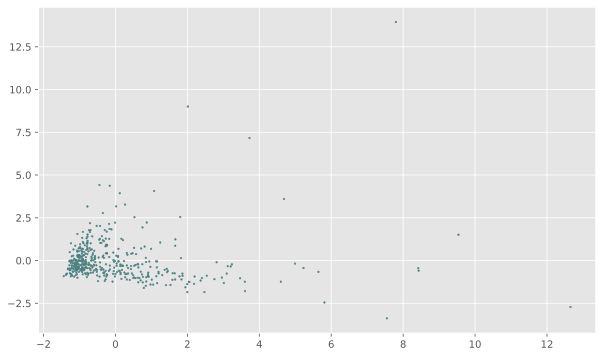

In [ ]:
plt.scatter(pca_data[:,0],pca_data[:,1],color=(0.3,0.5,0.5),s=3)

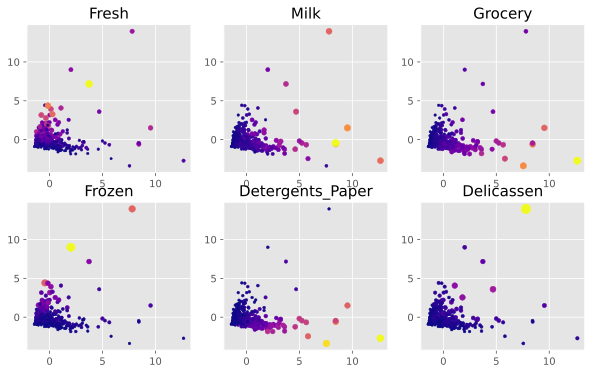

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
j=0
fig, axs = plt.subplots(2, 3)
for item in features:
  cmap='plasma'
  sizes=10+5*std_data[:,features.index(item)]
  cols=df[item]
  axs[j//3,j%3].scatter(pca_data[:,0],pca_data[:,1],s=sizes,c=cols,cmap=cmap)
  axs[j//3,j%3].set_title(item, fontsize=15)
  j=j+1

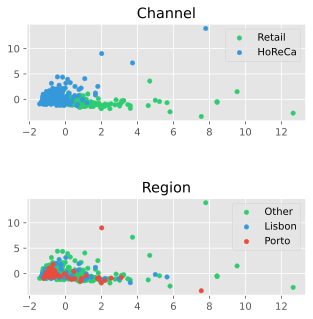

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(5, 5))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'viridis'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(pca_data[df[feature]==unique_val, 0], pca_data[df[feature]==unique_val, 1], s=20,label=unique_val)
        ax.set_title(feature)
        ax.legend()
plt.subplots_adjust(hspace=0.8)

## Task 4: Kernel Principal Component Analysis
Let's go over some [KPCA theory](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.KernelPCA.html), and see see if it works better than standard PCA.

In [ ]:
from sklearn.decomposition import KernelPCA

### Polynomial Function

In [ ]:
kpca = KernelPCA(n_components=2, kernel='rbf', degree=2)
kpca_poly_data = kpca.fit_transform(std_data)

/usr/local/lib/python3.9/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


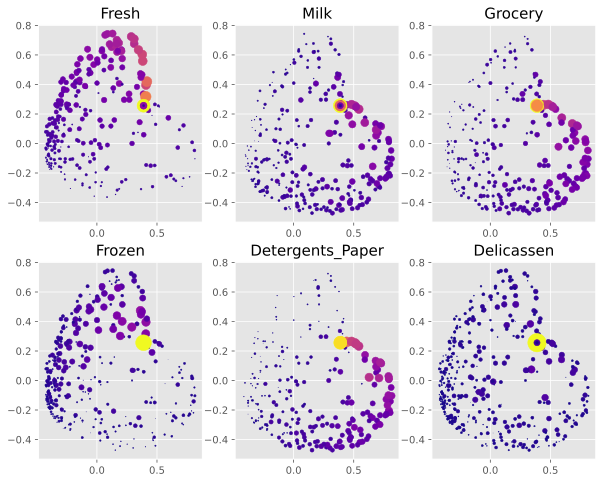

In [ ]:
plt.rcParams["figure.figsize"] = (10,8)
j=0
fig, axs = plt.subplots(2, 3)
for item in features:
  cmap='plasma'
  sizes=10+20*std_data[:,features.index(item)]
  cols=df[item]
  axs[j//3,j%3].scatter(kpca_poly_data[:,0],kpca_poly_data[:,1],s=sizes,c=cols,cmap=cmap)
  axs[j//3,j%3].set_title(item, fontsize=15)
  j=j+1

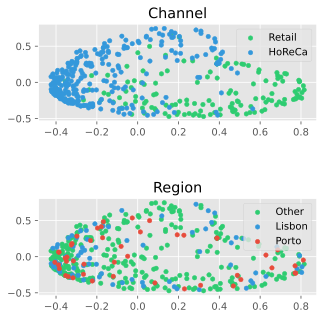

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(5, 5))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'viridis'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(kpca_poly_data[df[feature]==unique_val, 0], kpca_poly_data[df[feature]==unique_val, 1],
                   s=20,label=unique_val)
        ax.set_title(feature)
        ax.legend()
plt.subplots_adjust(hspace=0.8)

### Radial Basis Function

In [ ]:
kpca = KernelPCA(n_components=2, kernel='rbf')
kpca_rbf_data = kpca.fit_transform(std_data)

/usr/local/lib/python3.9/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


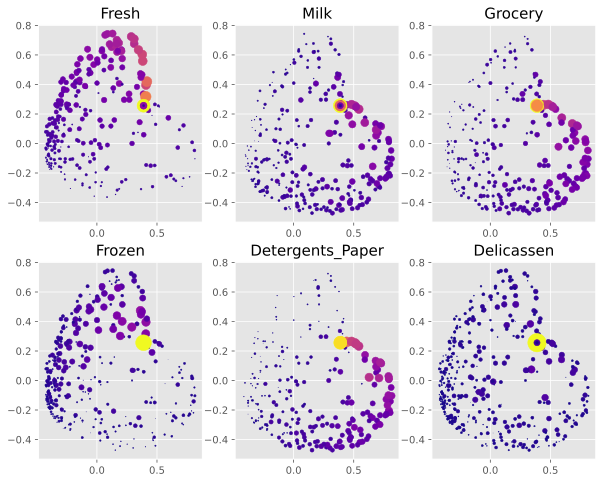

In [ ]:
plt.rcParams["figure.figsize"] = (10,8)
j=0
fig, axs = plt.subplots(2, 3)
for item in features:
  cmap='plasma'
  sizes=10+20*std_data[:,features.index(item)]
  cols=df[item]
  axs[j//3,j%3].scatter(kpca_rbf_data[:,0],kpca_rbf_data[:,1],s=sizes,c=cols,cmap=cmap)
  axs[j//3,j%3].set_title(item, fontsize=15)
  j=j+1

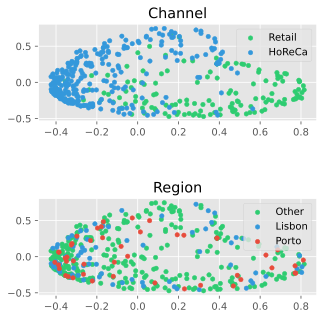

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(5, 5))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'viridis'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(kpca_rbf_data[df[feature]==unique_val, 0], kpca_rbf_data[df[feature]==unique_val, 1],
                   s=20,label=unique_val)
        ax.set_title(feature)
        ax.legend()
plt.subplots_adjust(hspace=0.8)

### Cosine Function

In [ ]:
kpca = KernelPCA(n_components=2, kernel='cosine')
kpca_cos_data = kpca.fit_transform(std_data)

/usr/local/lib/python3.9/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


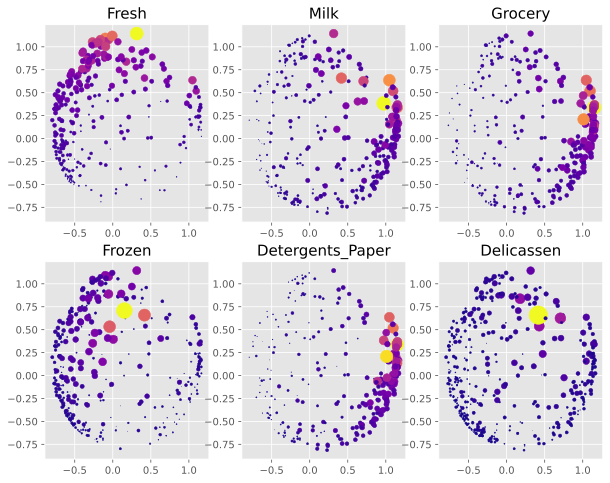

In [ ]:
plt.rcParams["figure.figsize"] = (10,8)
j=0
fig, axs = plt.subplots(2, 3)
for item in features:
  cmap='plasma'
  sizes=10+20*std_data[:,features.index(item)]
  cols=df[item]
  axs[j//3,j%3].scatter(kpca_cos_data[:,0],kpca_cos_data[:,1],s=sizes,c=cols,cmap=cmap)
  axs[j//3,j%3].set_title(item, fontsize=15)
  j=j+1

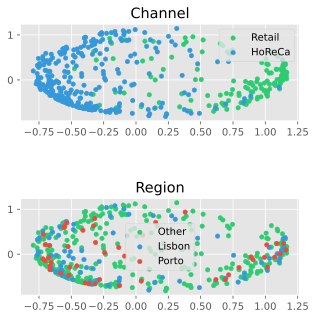

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(5, 5))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'viridis'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(kpca_cos_data[df[feature]==unique_val, 0], kpca_cos_data[df[feature]==unique_val, 1],
                   s=20,label=unique_val)
        ax.set_title(feature)
        ax.legend()
plt.subplots_adjust(hspace=0.8)

## Task 5: K-Means Clustering
We'll talk about the [K-Means Clustering Algorithm](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html), and how we can use the [Elbow Method](https://www.scikit-yb.org/en/latest/api/cluster/elbow.html) to help us out. 

In [ ]:
from sklearn.cluster import KMeans

from yellowbrick.cluster import KElbowVisualizer

In [ ]:
# choosing cosine , because best visualisation results
cluster_model = KMeans(n_clusters=5)
clusters=cluster_model.fit_predict(kpca_cos_data)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
clusters[0:5]

array([4, 4, 3, 2, 0], dtype=int32)

In [ ]:
# different way of plotting data from matplotlib
markers = list('*hH+xXDd|.,ov^<>12348spP')

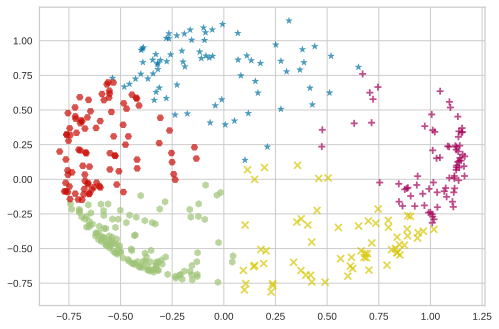

In [ ]:
for cluster in np.unique(clusters):
    cluster_data = kpca_cos_data[clusters==cluster]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], alpha=0.7, marker=markers[cluster])

/usr/local/lib/python3.9/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
<ipython-input-44-25f44e7d4e98>:9: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[j//3,j%3].scatter(cluster_data[:,0],cluster_data[:,1],s=sizes


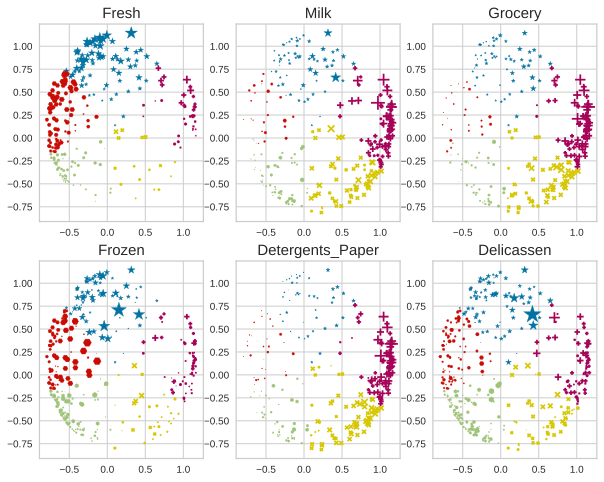

In [ ]:
plt.rcParams["figure.figsize"] = (10,8)
j=0
fig, axs = plt.subplots(2, 3)
for item in features:
  cols='plasma'
  for cluster in np.unique(clusters):
    sizes=10+20*std_data[:,features.index(item)][cluster==clusters]
    cluster_data = kpca_cos_data[clusters==cluster]
    axs[j//3,j%3].scatter(cluster_data[:,0],cluster_data[:,1],s=sizes
                          ,cmap=cols,marker=markers[cluster], label=f'Cluster {cluster}')
    axs[j//3,j%3].set_title(item, fontsize=15)
  j=j+1

### Elbow Method

In [ ]:
KElbowVisualizer?

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

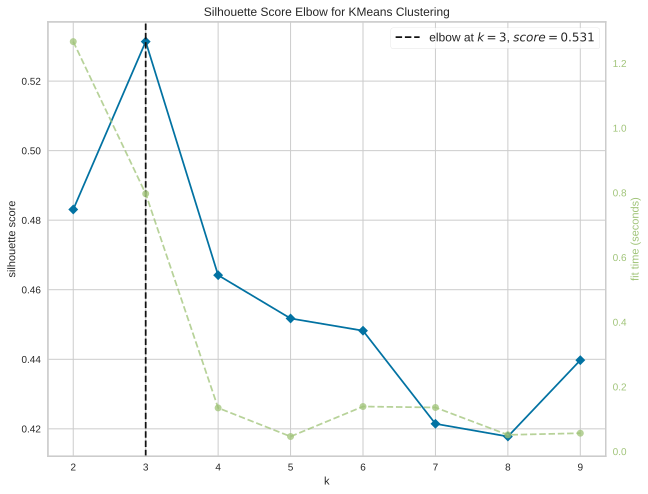

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [ ]:
cluster_model=KMeans()
visual=KElbowVisualizer(cluster_model,k=(2,10),metric='silhouette')
visual.fit(kpca_cos_data)
visual.show()

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

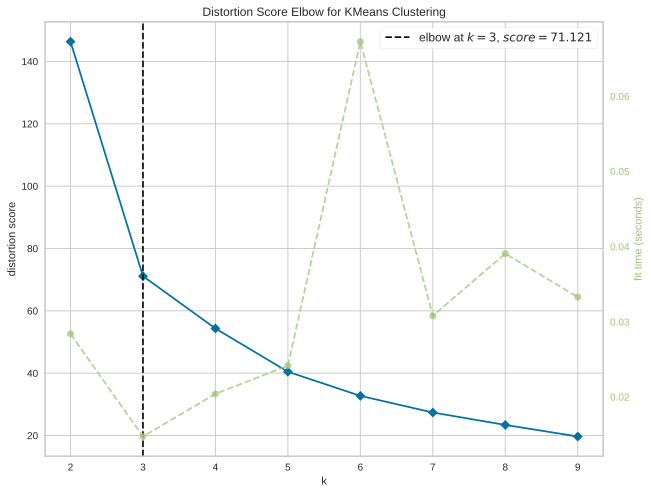

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
cluster_model=KMeans()
visual=KElbowVisualizer(cluster_model,k=(2,10),metric='distortion')
visual.fit(kpca_cos_data)
visual.show()

In [ ]:
cluster_model = KMeans(n_clusters=3)
clusters=cluster_model.fit_predict(kpca_cos_data)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


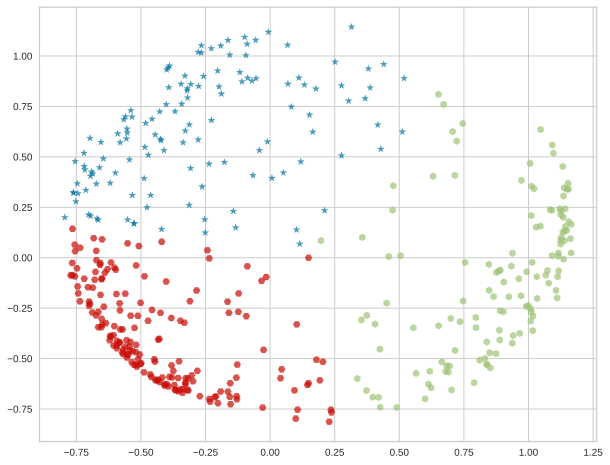

In [ ]:
for cluster in np.unique(clusters):
    cluster_data = kpca_cos_data[clusters==cluster]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], alpha=0.7, marker=markers[cluster])

/usr/local/lib/python3.9/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
<ipython-input-50-25f44e7d4e98>:9: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[j//3,j%3].scatter(cluster_data[:,0],cluster_data[:,1],s=sizes


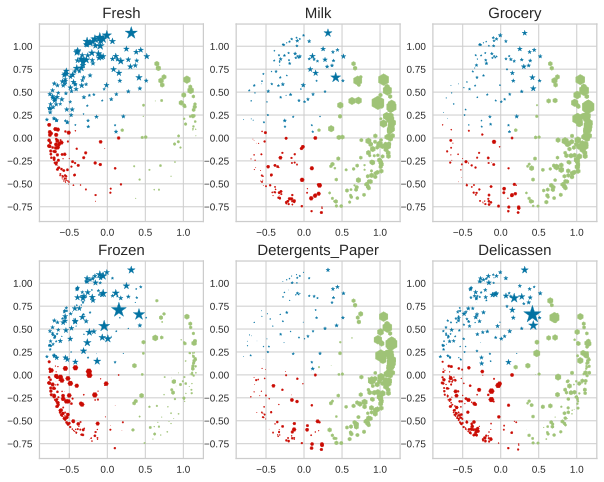

In [ ]:
plt.rcParams["figure.figsize"] = (10,8)
j=0
fig, axs = plt.subplots(2, 3)
for item in features:
  cols='plasma'
  for cluster in np.unique(clusters):
    sizes=10+20*std_data[:,features.index(item)][cluster==clusters]
    cluster_data = kpca_cos_data[clusters==cluster]
    axs[j//3,j%3].scatter(cluster_data[:,0],cluster_data[:,1],s=sizes
                          ,cmap=cols,marker=markers[cluster], label=f'Cluster {cluster}')
    axs[j//3,j%3].set_title(item, fontsize=15)
  j=j+1

## Task 6: Interactive Cluster Analysis
lets say from industry experience we know there are 5 different types of customers that we want to market to

In [ ]:
cluster_model = KMeans(n_clusters=5)
clusters=cluster_model.fit_predict(kpca_cos_data)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
df['cluster']=clusters

In [ ]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,cluster
0,Retail,Other,12669,9656,7561,214,2674,1338,2
1,Retail,Other,7057,9810,9568,1762,3293,1776,1
2,Retail,Other,6353,8808,7684,2405,3516,7844,1
3,HoReCa,Other,13265,1196,4221,6404,507,1788,0
4,Retail,Other,22615,5410,7198,3915,1777,5185,3


In [ ]:
df.groupby(['cluster','Channel','Region']).count()

Fresh  Milk  Grocery  Frozen  Detergents_Paper  \
cluster Channel Region                                                   
0       HoReCa  Lisbon     20    20       20      20                20   
                Porto      14    14       14      14                14   
                Other      54    54       54      54                54   
        Retail  Lisbon      0     0        0       0                 0   
                Porto       0     0        0       0                 0   
                Other       3     3        3       3                 3   
1       HoReCa  Lisbon      3     3        3       3                 3   
                Porto       0     0        0       0                 0   
                Other       2     2        2       2                 2   
        Retail  Lisbon     12    12       12      12                12   
                Porto      10    10       10      10                10   
                Other      52    52       52      52                52   
2       HoReCa  Lisbon      6     6        6       6                 6   
                Porto       0     0        0       0                 0   
                Other      16    16       16      16                16   
        Retail  Lisbon      3     3        3       3                 3   
                Porto       4     4        4       4                 4   
                Other      33    33       33      33                33   
3       HoReCa  Lisbon      7     7        7       7                 7   
                Porto       2     2        2       2                 2   
                Other      47    47       47      47                47   
        Retail  Lisbon      2     2        2       2                 2   
                Porto       3     3        3       3                 3   
                Other      14    14       14      14                14   
4       HoReCa  Lisbon     23    23       23      23                23   
                Porto      12    12       12      12                12   
                Other      92    92       92      92                92   
        Retail  Lisbon      1     1        1       1                 1   
                Porto       2     2        2       2                 2   
                Other       3     3        3       3                 3   

                        Delicassen  
cluster Channel Region              
0       HoReCa  Lisbon          20  
                Porto           14  
                Other           54  
        Retail  Lisbon           0  
                Porto            0  
                Other            3  
1       HoReCa  Lisbon           3  
                Porto            0  
                Other            2  
        Retail  Lisbon          12  
                Porto           10  
                Other           52  
2       HoReCa  Lisbon           6  
                Porto            0  
                Other           16  
        Retail  Lisbon           3  
                Porto            4  
                Other           33  
3       HoReCa  Lisbon           7  
                Porto            2  
                Other           47  
        Retail  Lisbon           2  
                Porto            3  
                Other           14  
4       HoReCa  Lisbon          23  
                Porto           12  
                Other           92  
        Retail  Lisbon           1  
                Porto            2  
                Other            3

In [ ]:
df.groupby(['cluster','Channel','Region'])[features].mean()

Fresh          Milk       Grocery  \
cluster Channel Region                                             
0       HoReCa  Lisbon  16145.200000   1839.800000   2417.000000   
                Porto   13667.714286   1714.142857   3561.642857   
                Other   15885.685185   1960.277778   2387.462963   
        Retail  Lisbon           NaN           NaN           NaN   
                Porto            NaN           NaN           NaN   
                Other   16085.666667   3109.666667   4594.000000   
1       HoReCa  Lisbon   6364.666667  17421.333333  11328.333333   
                Porto            NaN           NaN           NaN   
                Other   11908.500000  15602.500000  14858.000000   
        Retail  Lisbon   4302.166667  13440.833333  23713.250000   
                Porto    4998.900000  12905.200000  23565.600000   
                Other    8964.596154  15849.384615  22367.865385   
2       HoReCa  Lisbon   3218.333333   7438.166667   7476.500000   
                Porto            NaN           NaN           NaN   
                Other    2835.500000   6629.625000   8714.687500   
        Retail  Lisbon   2443.333333   6128.333333   9281.333333   
                Porto    3121.500000   6622.250000  10607.750000   
                Other    4539.060606   6606.030303  10429.969697   
3       HoReCa  Lisbon  37747.142857   6045.857143   7376.142857   
                Porto   31176.000000   9559.500000  10953.000000   
                Other   32946.382979   5885.468085   6021.255319   
        Retail  Lisbon  15927.000000   5955.000000   7413.500000   
                Porto   20117.666667   4662.666667   6631.000000   
                Other   23989.500000   6507.428571   9703.857143   
4       HoReCa  Lisbon   5899.782609   2275.304348   2553.260870   
                Porto    6042.916667   1783.500000   4275.416667   
                Other    4921.489130   2347.847826   2598.130435   
        Retail  Lisbon   2790.000000   2527.000000   5265.000000   
                Porto    7839.000000   2548.000000   6110.000000   
                Other   10750.000000   3468.666667   6065.333333   

                              Frozen  Detergents_Paper   Delicassen  
cluster Channel Region                                               
0       HoReCa  Lisbon   3682.900000        349.750000  1045.000000  
                Porto    5415.928571        407.857143  1123.500000  
                Other    3999.814815        426.111111   825.555556  
        Retail  Lisbon           NaN               NaN          NaN  
                Porto            NaN               NaN          NaN  
                Other    1181.666667       1537.000000  1096.333333  
1       HoReCa  Lisbon   5405.000000       2735.000000  3096.333333  
                Porto            NaN               NaN          NaN  
                Other    3388.000000       2680.500000  3507.000000  
        Retail  Lisbon   2153.000000      10679.750000  2188.833333  
                Porto    1106.200000      12201.800000  1326.400000  
                Other    1807.500000      10082.557692  2208.115385  
2       HoReCa  Lisbon   1071.666667       2718.500000   960.000000  
                Porto            NaN               NaN          NaN  
                Other    1316.000000       2991.125000  1075.000000  
        Retail  Lisbon   1662.000000       5195.666667   793.000000  
                Porto     647.250000       6188.000000   465.500000  
                Other     909.454545       4387.848485  1169.393939  
3       HoReCa  Lisbon   7186.714286        611.142857  2868.142857  
                Porto   31957.500000        821.500000  2863.000000  
                Other    8011.893617        912.127660  3631.404255  
        Retail  Lisbon   5040.000000       1761.500000  1845.000000  
                Porto    4582.666667       2368.333333  2543.333333  
                Other    2002.500000       2929.285714  2431.571429  
4       HoReCa  Lisbon   1647.9130

In [ ]:
df.groupby('cluster').count()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
cluster,,,,,,,,
0,91,91,91,91,91,91,91,91
1,79,79,79,79,79,79,79,79
2,62,62,62,62,62,62,62,62
3,75,75,75,75,75,75,75,75
4,133,133,133,133,133,133,133,133


In [ ]:
biggest_cluster_entries=df.groupby('cluster').count().max().max()
biggest_cluster_entries

133

In [ ]:
clusters=df.cluster.tolist()

In [ ]:
df_normalised =df.copy(deep=True)
df_normalised [features] = df_normalised [features]/df_normalised [features].max()

In [ ]:
df_normalised.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,cluster
0,Retail,Other,0.112964,0.131378,0.081494,0.003516,0.065496,0.027908,2
1,Retail,Other,0.062924,0.133473,0.103126,0.028947,0.080657,0.037044,1
2,Retail,Other,0.056647,0.119840,0.082820,0.039511,0.086119,0.163611,1
3,HoReCa,Other,0.118278,0.016273,0.045495,0.105210,0.012418,0.037294,0
4,Retail,Other,0.201648,0.073607,0.077581,0.064318,0.043525,0.108149,3


In [ ]:
import plotly.graph_objects as go

In [ ]:
fig = go.Figure()

for cluster in np.unique(clusters):
    
    radii = df_normalised.loc[df_normalised.cluster==cluster, features].mean().tolist()
    thetas = features
    
    actual_values = df.loc[df.cluster==cluster, features].mean().tolist()
    cluster_size = len(df[df.cluster==cluster])
    fig.add_trace(
        go.Scatterpolar(
            r=radii + radii[:1],
            theta=thetas + thetas[:1],
            mode='lines',
            name=f'Cluster {cluster}',
            text = [f'Mean value: {x}' for x in actual_values + actual_values[:1]],
            line=dict(width=3),
            opacity=np.max([cluster_size/biggest_cluster_entries, 0.6])
        )
    )

fig.update_layout(
    title='Cluster Analysis',
    showlegend=True,
    template='plotly_dark',
    width=800,
    autosize=False
)

fig.show()

91
79
62
75
133


In [ ]:
fig.write_html('Result.html')